In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats

import wrangle as w

# Acquire

In [2]:
wines = pd.read_csv('wines.csv')

In [3]:
wines.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6497 entries, 0 to 6496
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         6497 non-null   float64
 1   volatile acidity      6497 non-null   float64
 2   citric acid           6497 non-null   float64
 3   residual sugar        6497 non-null   float64
 4   chlorides             6497 non-null   float64
 5   free sulfur dioxide   6497 non-null   float64
 6   total sulfur dioxide  6497 non-null   float64
 7   density               6497 non-null   float64
 8   pH                    6497 non-null   float64
 9   sulphates             6497 non-null   float64
 10  alcohol               6497 non-null   float64
 11  quality               6497 non-null   int64  
 12  wine_type             6497 non-null   object 
dtypes: float64(11), int64(1), object(1)
memory usage: 660.0+ KB


In [4]:
wines.columns = wines.columns.str.replace(' ','_')

In [5]:
wines.head()

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality,wine_type
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6,white
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6,white
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6,white
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6,white
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6,white


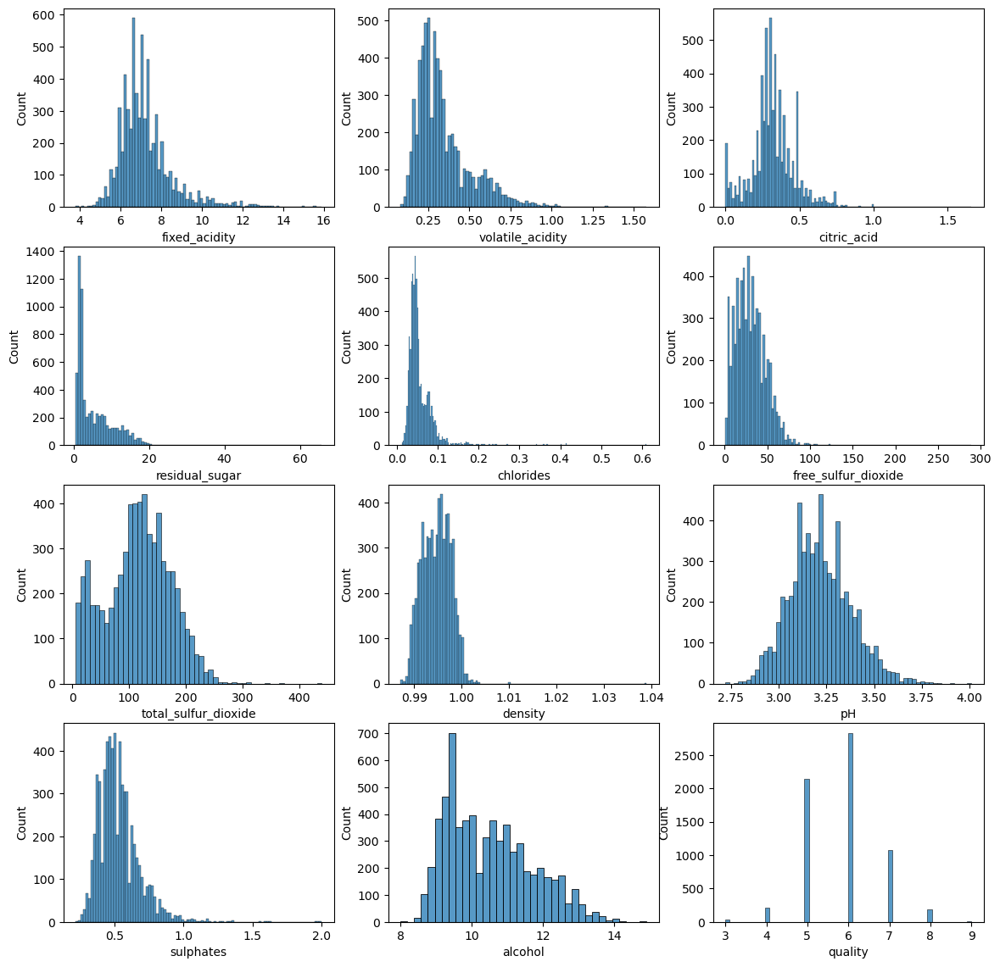

In [6]:
plt.figure(figsize=(14,14))

for i, col in enumerate(wines.drop(columns='wine_type')):
    plt.subplot(4,3,i+1)
    sns.histplot(wines[col])
    
plt.show()

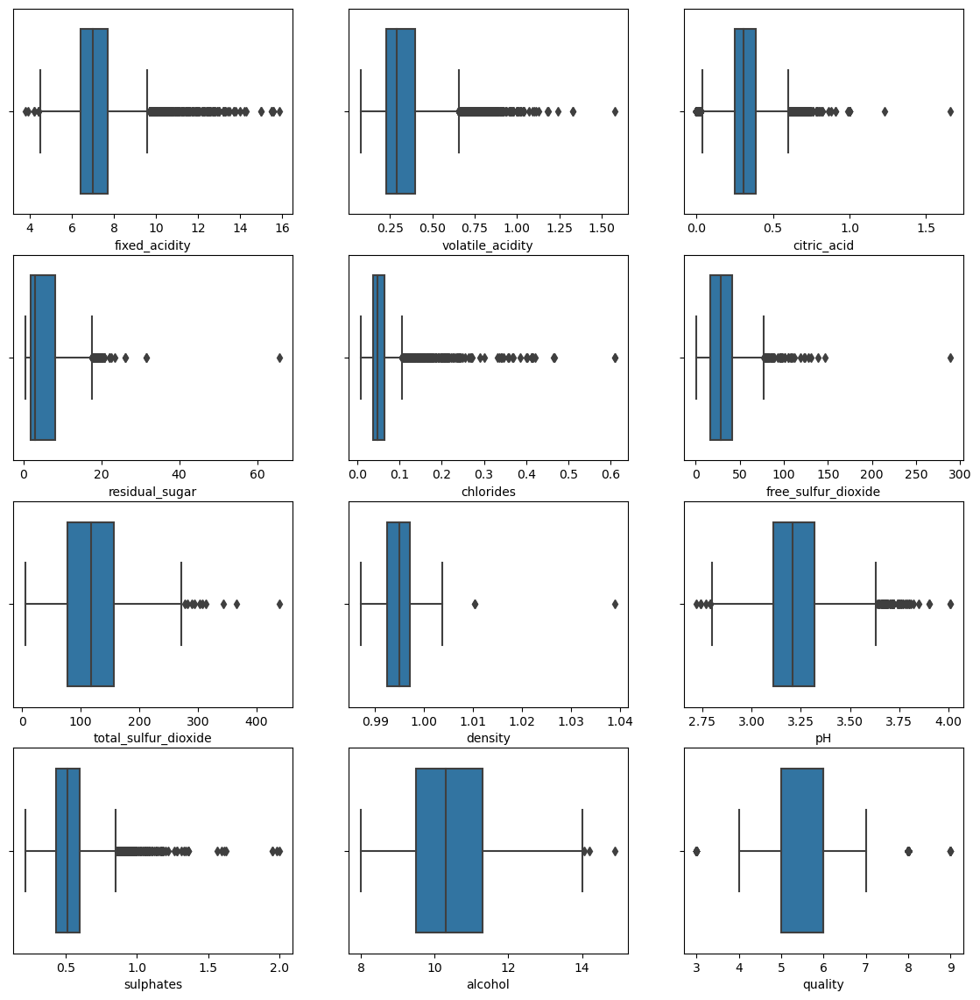

In [7]:
plt.figure(figsize=(14,14))

for i, col in enumerate(wines.drop(columns='wine_type')):
    plt.subplot(4,3,i+1)
    sns.boxplot(wines[col])
    
plt.show()

In [8]:
wines = w.prepare_data(wines)

In [9]:
wines.isnull().sum()

fixed_acidity           0
volatile_acidity        0
citric_acid             0
residual_sugar          0
chlorides               0
free_sulfur_dioxide     0
total_sulfur_dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
wine_type               0
dtype: int64

In [10]:
train, validate, test = w.split_data(wines)

In [11]:
train.shape

(3522, 13)

In [12]:
import scipy.stats as stats

In [13]:
corr_df = pd.DataFrame({'feature': [],
                        'r': [],
                       'p': []})

for i, col in enumerate(train.drop(columns='wine_type')):
    r, p = stats.pearsonr(train[col], train['quality'])
    corr_df.loc[i] = [col, abs(r), p]

corr_df.sort_values(by='r', ascending=False)

,feature,r,p
11,quality,1.000000,0.000000e+00
10,alcohol,0.455295,8.087609e-180
7,density,0.310984,7.757551e-80
1,volatile_acidity,0.233614,7.267833e-45
4,chlorides,0.229236,3.205283e-43
2,citric_acid,0.092676,3.590732e-08
0,fixed_acidity,0.079835,2.097567e-06
5,free_sulfur_dioxide,0.058902,4.697298e-04
6,total_sulfur_dioxide,0.046382,5.902688e-03
8,pH,0.039168,2.009728e-02


In [14]:
pd.DataFrame({'r': [r], 'p': [p]})

,r,p
0,1.0,0.0


In [15]:
t, p = stats.ttest_ind(train.quality[train.wine_type == 'red'], train.quality[train.wine_type == 'white'])

In [16]:
p

1.2528177403301481e-09

In [17]:
t

-6.089713133809913

In [18]:
from sklearn.preprocessing import MinMaxScaler

In [19]:
cols = ['alcohol','density']

In [20]:
def scale_data(train, 
               validate, 
               test, 
               cols):
    '''Takes in train, validate, and test set, and outputs scaled versions of the columns that were sent in as dataframes'''
    
    #Make copies for scaling
    train_scaled = train.copy() #Ah, making a copy of the df and then overwriting the data in .transform() to remove warning message
    validate_scaled = validate.copy()
    test_scaled = test.copy()

    #Initiate scaler, using Robust Scaler
    scaler = MinMaxScaler()

    #Fit to train only
    scaler.fit(train[cols])

    #Creates scaled dataframes of train, validate, and test. This will still preserve columns that were not sent in initially.
    train_scaled[cols] = scaler.transform(train[cols])
    validate_scaled[cols] = scaler.transform(validate[cols])
    test_scaled[cols] = scaler.transform(test[cols])
    
    return train_scaled, validate_scaled, test_scaled

In [21]:
train_scaled, validate_scaled, test_scaled = scale_data(train, validate, test, cols)

In [22]:
train_scaled.head()

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality,wine_type
1811,7.6,0.38,0.20,3.40,0.046,9.0,116.0,0.514331,3.15,0.41,0.264151,5,white
3551,5.7,0.22,0.22,16.65,0.044,39.0,110.0,0.844745,3.24,0.48,0.188679,6,white
3338,7.2,0.27,0.28,15.20,0.046,6.0,41.0,0.693471,3.17,0.39,0.547170,6,white
1475,7.2,0.08,0.49,1.30,0.050,18.0,148.0,0.522293,3.46,0.44,0.415094,6,white
184,6.8,0.26,0.56,11.90,0.043,64.0,226.0,0.721338,3.02,0.63,0.245283,5,white


In [23]:
train.head()

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality,wine_type
1811,7.6,0.38,0.20,3.40,0.046,9.0,116.0,0.99440,3.15,0.41,9.4,5,white
3551,5.7,0.22,0.22,16.65,0.044,39.0,110.0,0.99855,3.24,0.48,9.0,6,white
3338,7.2,0.27,0.28,15.20,0.046,6.0,41.0,0.99665,3.17,0.39,10.9,6,white
1475,7.2,0.08,0.49,1.30,0.050,18.0,148.0,0.99450,3.46,0.44,10.2,6,white
184,6.8,0.26,0.56,11.90,0.043,64.0,226.0,0.99700,3.02,0.63,9.3,5,white


In [24]:
from itertools import combinations
pairwise_combinations = list(combinations(train.drop(columns=['wine_type', 'quality']).columns, 2))

pairwise_combinations

[('fixed_acidity', 'volatile_acidity'),
 ('fixed_acidity', 'citric_acid'),
 ('fixed_acidity', 'residual_sugar'),
 ('fixed_acidity', 'chlorides'),
 ('fixed_acidity', 'free_sulfur_dioxide'),
 ('fixed_acidity', 'total_sulfur_dioxide'),
 ('fixed_acidity', 'density'),
 ('fixed_acidity', 'pH'),
 ('fixed_acidity', 'sulphates'),
 ('fixed_acidity', 'alcohol'),
 ('volatile_acidity', 'citric_acid'),
 ('volatile_acidity', 'residual_sugar'),
 ('volatile_acidity', 'chlorides'),
 ('volatile_acidity', 'free_sulfur_dioxide'),
 ('volatile_acidity', 'total_sulfur_dioxide'),
 ('volatile_acidity', 'density'),
 ('volatile_acidity', 'pH'),
 ('volatile_acidity', 'sulphates'),
 ('volatile_acidity', 'alcohol'),
 ('citric_acid', 'residual_sugar'),
 ('citric_acid', 'chlorides'),
 ('citric_acid', 'free_sulfur_dioxide'),
 ('citric_acid', 'total_sulfur_dioxide'),
 ('citric_acid', 'density'),
 ('citric_acid', 'pH'),
 ('citric_acid', 'sulphates'),
 ('citric_acid', 'alcohol'),
 ('residual_sugar', 'chlorides'),
 ('resid

In [25]:
len(pairwise_combinations)

55

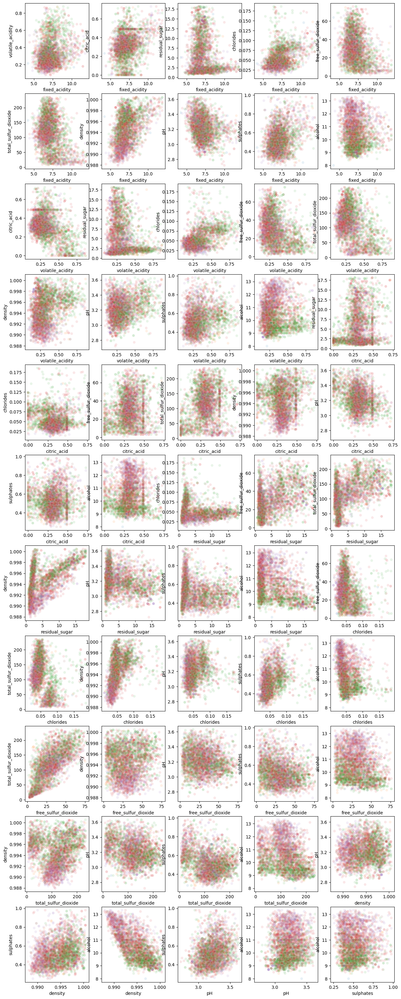

In [26]:
plt.figure(figsize=(15, 40))
x=1
for i in pairwise_combinations:
    plt.subplot(11,5,x)
    sns.scatterplot(data=train, x=i[0], y=i[1], hue='quality', palette='tab10', alpha=0.1)
    plt.legend([], [], frameon=False)
    x = x+1

plt.show()

In [27]:
pairwise_combinations[0][0]

'fixed_acidity'

In [28]:
train.quality

1811    5
3551    6
3338    6
1475    6
184     5
       ..
3386    8
740     3
628     6
1597    6
1290    6
Name: quality, Length: 3522, dtype: int64

In [29]:
train['quality_bin'] = pd.qcut(train.quality, q=3, labels=['low','mid','high'])

<AxesSubplot:xlabel='quality', ylabel='Count'>

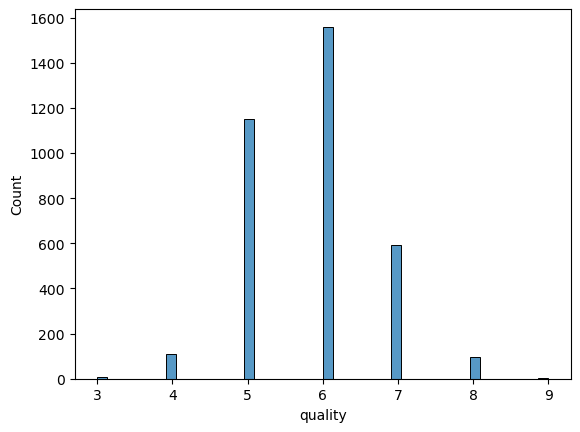

In [30]:
sns.histplot(train.quality)

In [31]:
train[train.quality_bin == 'low']

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality,wine_type,quality_bin
1811,7.6,0.38,0.20,3.4,0.046,9.0,116.0,0.99440,3.15,0.41,9.4,5,white,low
184,6.8,0.26,0.56,11.9,0.043,64.0,226.0,0.99700,3.02,0.63,9.3,5,white,low
4137,7.4,0.31,0.26,8.6,0.048,47.0,206.0,0.99640,3.26,0.36,9.1,5,white,low
1053,9.4,0.29,0.55,2.2,0.050,17.0,119.0,0.99620,3.12,0.69,10.3,4,white,low
2446,6.6,0.32,0.33,2.5,0.052,40.0,210.0,0.99316,3.15,0.60,10.0,5,white,low
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1451,7.2,0.40,0.49,1.1,0.048,11.0,138.0,0.99290,3.01,0.42,9.3,5,white,low
3770,7.4,0.27,0.31,2.4,0.014,15.0,143.0,0.99094,3.03,0.65,12.0,4,white,low
5235,7.8,0.43,0.32,2.8,0.080,29.0,58.0,0.99740,3.31,0.64,10.3,5,red,low
2567,6.6,0.24,0.28,1.8,0.028,39.0,132.0,0.99182,3.34,0.46,11.4,5,white,low


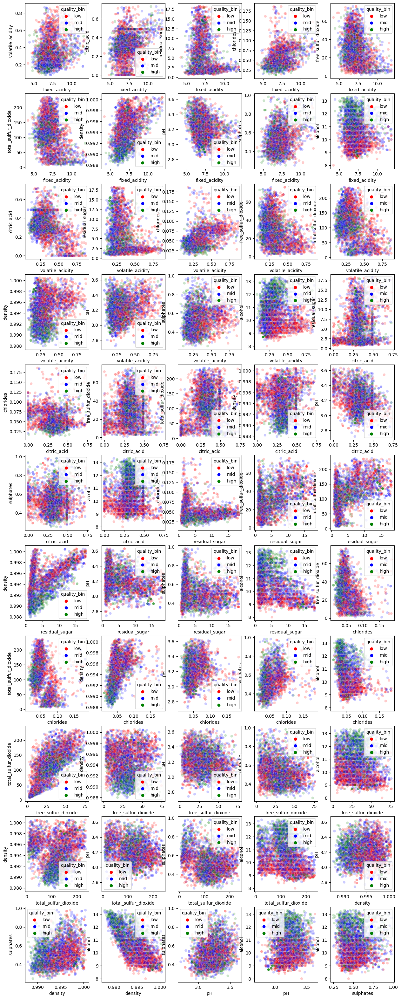

In [32]:
plt.figure(figsize=(15, 40))
x=1
for i in pairwise_combinations:
    plt.subplot(11,5,x)
    sns.scatterplot(data=train, x=i[0], y=i[1], hue='quality_bin', palette=['red', 'blue', 'green'], alpha=0.2)
#    plt.legend([], [], frameon=False)
    x = x+1

plt.show()

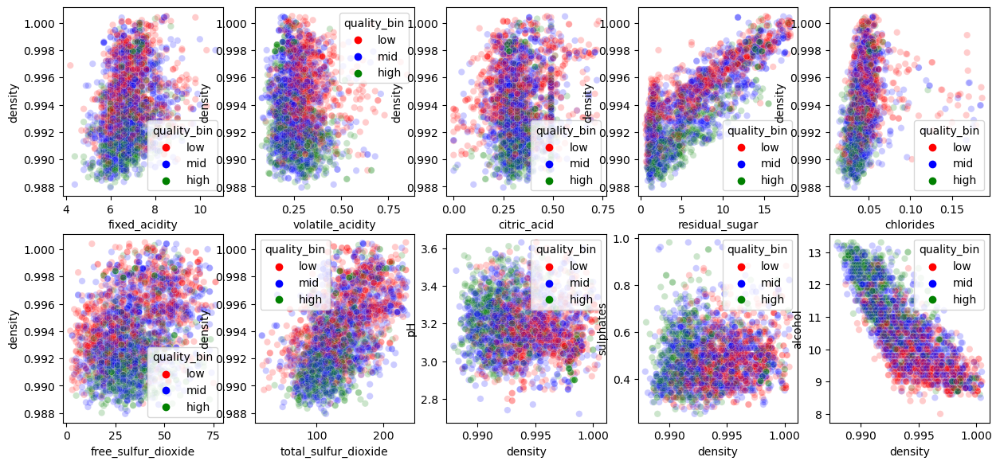

In [45]:
# White wines

plt.figure(figsize=(15, 40))
x=1
for i in pairwise_combinations:
    if 'density' in i:
        plt.subplot(11,5,x)
        sns.scatterplot(data=train[train.wine_type == 'white'], x=i[0], y=i[1], hue='quality_bin', palette=['red', 'blue', 'green'], alpha=0.2)
#    plt.legend([], [], frameon=False)
        x = x+1

plt.show()

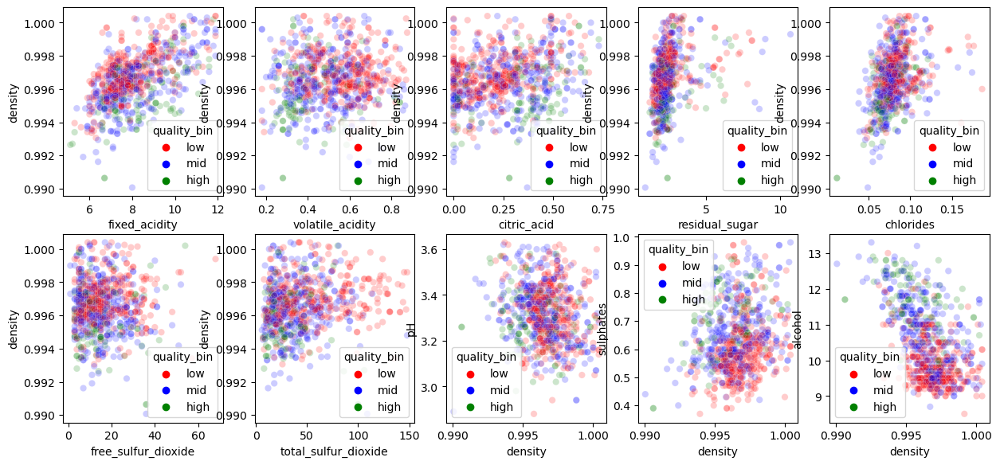

In [46]:
# Red Wines

plt.figure(figsize=(15, 40))
x=1
for i in pairwise_combinations:
    if 'density' in i:
        plt.subplot(11,5,x)
        sns.scatterplot(data=train[train.wine_type == 'red'], x=i[0], y=i[1], hue='quality_bin', palette=['red', 'blue', 'green'], alpha=0.2)
#    plt.legend([], [], frameon=False)
        x = x+1

plt.show()

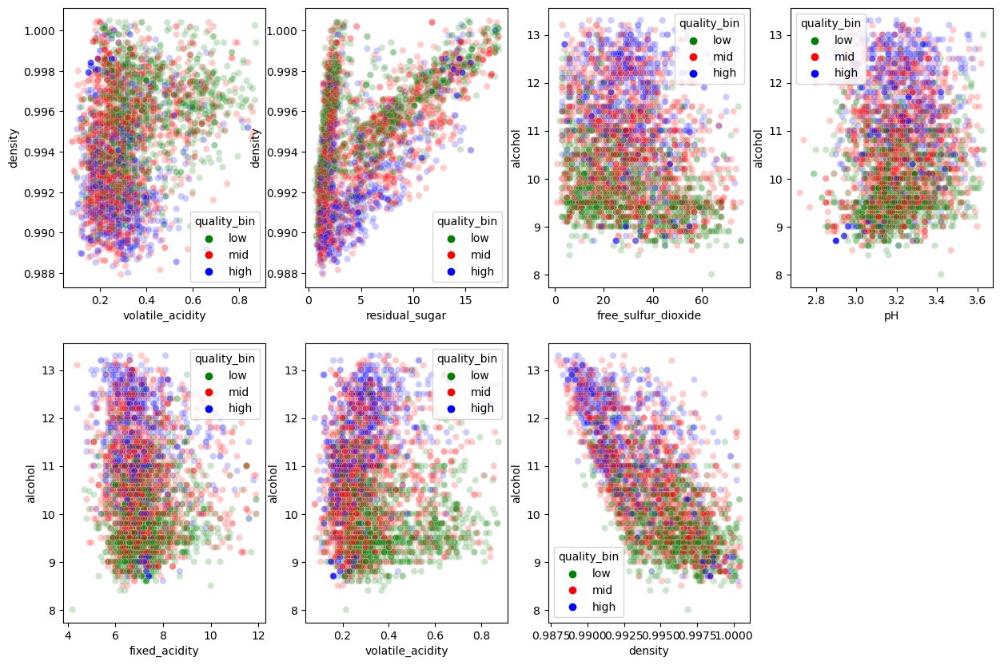

In [34]:
c_list = ['green', 'red', 'blue']

plt.figure(figsize=(15, 10))

plt.subplot(2,4,1)
sns.scatterplot(data=train, x='volatile_acidity', y='density', hue='quality_bin', palette=c_list, alpha=0.2)
#plt.legend([], [], frameon=False)

plt.subplot(2,4,2)
sns.scatterplot(data=train, x='residual_sugar', y='density', hue='quality_bin', palette=c_list, alpha=0.2)

plt.subplot(2,4,3)
sns.scatterplot(data=train, x='free_sulfur_dioxide', y='alcohol', hue='quality_bin', palette=c_list, alpha=0.2)

plt.subplot(2,4,4)
sns.scatterplot(data=train, x='pH', y='alcohol', hue='quality_bin', palette=c_list, alpha=0.2)

plt.subplot(2,4,5)
sns.scatterplot(data=train, x='fixed_acidity', y='alcohol', hue='quality_bin', palette=c_list, alpha=0.2)

plt.subplot(2,4,6)
sns.scatterplot(data=train, x='volatile_acidity', y='alcohol', hue='quality_bin', palette=c_list, alpha=0.2)

plt.subplot(2,4,7)
sns.scatterplot(data=train, x='density', y='alcohol', hue='quality_bin', palette=c_list, alpha=0.2)

plt.show()

In [35]:
import wrangle as w

In [36]:
train_scaled, validate_scaled, test_scaled =  w.scale_data(train, validate, test, 
        cols=train.iloc[:, 0:11].columns)

In [37]:
train_scaled

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality,wine_type,quality_bin
1811,0.441558,0.377358,0.273973,0.159544,0.195402,0.106667,0.478261,0.514331,0.472527,0.219178,0.264151,5,white,low
3551,0.194805,0.176101,0.301370,0.914530,0.183908,0.506667,0.452174,0.844745,0.571429,0.315068,0.188679,6,white,mid
3338,0.389610,0.238994,0.383562,0.831909,0.195402,0.066667,0.152174,0.693471,0.494505,0.191781,0.547170,6,white,mid
1475,0.389610,0.000000,0.671233,0.039886,0.218391,0.226667,0.617391,0.522293,0.813187,0.260274,0.415094,6,white,mid
184,0.337662,0.226415,0.767123,0.643875,0.178161,0.840000,0.956522,0.721338,0.329670,0.520548,0.245283,5,white,low
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3386,0.246753,0.251572,0.369863,0.233618,0.103448,0.733333,0.582609,0.197452,0.483516,0.232877,0.849057,8,white,high
740,0.350649,0.389937,0.547945,0.227920,0.057471,0.053333,0.056522,0.283439,0.648352,0.164384,0.867925,3,white,low
628,0.363636,0.301887,0.328767,0.319088,0.206897,0.400000,0.965217,0.617834,0.560440,0.506849,0.264151,6,white,mid
1597,0.285714,0.238994,0.671233,0.381766,0.195402,0.693333,0.869565,0.609873,0.571429,0.246575,0.226415,6,white,mid


In [38]:
test

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality,wine_type
6185,8.0,0.600,0.08,2.6,0.056,3.0,7.0,0.99286,3.22,0.37,13.0,5,red
1256,7.3,0.180,0.65,1.4,0.046,28.0,157.0,0.99460,3.33,0.62,9.4,6,white
3135,6.6,0.390,0.39,11.9,0.057,51.0,221.0,0.99851,3.26,0.51,8.9,6,white
591,7.3,0.200,0.37,1.2,0.037,48.0,119.0,0.99200,3.32,0.49,10.9,6,white
4683,6.5,0.330,0.32,1.0,0.041,39.0,120.0,0.99004,3.06,0.37,12.2,6,white
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2997,6.9,0.250,0.33,1.2,0.035,35.0,158.0,0.99082,3.02,0.58,11.3,6,white
2147,6.4,0.290,0.20,15.6,0.040,20.0,142.0,0.99620,3.10,0.54,10.6,5,white
988,6.9,0.190,0.33,1.6,0.043,63.0,149.0,0.99250,3.44,0.52,10.8,5,white
6176,8.0,0.715,0.22,2.3,0.075,13.0,81.0,0.99688,3.24,0.54,9.5,6,red


In [39]:
from sklearn.cluster import KMeans

X = train_scaled[['volatile_acidity', 'density']]

kmeans = KMeans(n_clusters=3)
kmeans.fit(X)
train_scaled['va_d'] = kmeans.predict(X)
train_scaled

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality,wine_type,quality_bin,va_d
1811,0.441558,0.377358,0.273973,0.159544,0.195402,0.106667,0.478261,0.514331,0.472527,0.219178,0.264151,5,white,low,2
3551,0.194805,0.176101,0.301370,0.914530,0.183908,0.506667,0.452174,0.844745,0.571429,0.315068,0.188679,6,white,mid,2
3338,0.389610,0.238994,0.383562,0.831909,0.195402,0.066667,0.152174,0.693471,0.494505,0.191781,0.547170,6,white,mid,2
1475,0.389610,0.000000,0.671233,0.039886,0.218391,0.226667,0.617391,0.522293,0.813187,0.260274,0.415094,6,white,mid,2
184,0.337662,0.226415,0.767123,0.643875,0.178161,0.840000,0.956522,0.721338,0.329670,0.520548,0.245283,5,white,low,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3386,0.246753,0.251572,0.369863,0.233618,0.103448,0.733333,0.582609,0.197452,0.483516,0.232877,0.849057,8,white,high,0
740,0.350649,0.389937,0.547945,0.227920,0.057471,0.053333,0.056522,0.283439,0.648352,0.164384,0.867925,3,white,low,0
628,0.363636,0.301887,0.328767,0.319088,0.206897,0.400000,0.965217,0.617834,0.560440,0.506849,0.264151,6,white,mid,2
1597,0.285714,0.238994,0.671233,0.381766,0.195402,0.693333,0.869565,0.609873,0.571429,0.246575,0.226415,6,white,mid,2


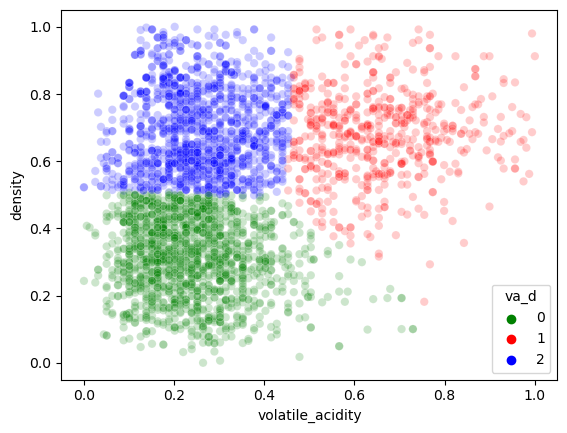

In [40]:
sns.scatterplot(data=train_scaled, x='volatile_acidity', y='density', hue='va_d', palette= c_list, alpha=0.2)
plt.show()

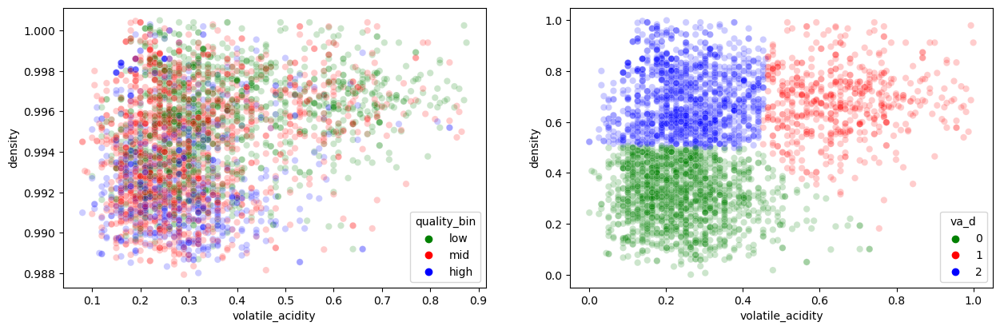

In [41]:
plt.figure(figsize=(15, 10))

plt.subplot(2,2,1)
sns.scatterplot(data=train, x='volatile_acidity', y='density', hue='quality_bin', palette=c_list, alpha=0.2)

plt.subplot(2,2,2)
sns.scatterplot(data=train_scaled, x='volatile_acidity', y='density', hue='va_d', palette= c_list, alpha=0.2)

plt.show()

In [42]:
from sklearn.cluster import KMeans

X = train_scaled[['free_sulfur_dioxide', 'alcohol']]

kmeans = KMeans(n_clusters=2
                , init = np.array([[0.3,0.3], [0.5,0.6]], np.float64)
                , max_iter=1
               )
kmeans.fit(X)
train_scaled['fsd_a'] = kmeans.predict(X)
train_scaled

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality,wine_type,quality_bin,va_d,fsd_a
1811,0.441558,0.377358,0.273973,0.159544,0.195402,0.106667,0.478261,0.514331,0.472527,0.219178,0.264151,5,white,low,2,0
3551,0.194805,0.176101,0.301370,0.914530,0.183908,0.506667,0.452174,0.844745,0.571429,0.315068,0.188679,6,white,mid,2,0
3338,0.389610,0.238994,0.383562,0.831909,0.195402,0.066667,0.152174,0.693471,0.494505,0.191781,0.547170,6,white,mid,2,0
1475,0.389610,0.000000,0.671233,0.039886,0.218391,0.226667,0.617391,0.522293,0.813187,0.260274,0.415094,6,white,mid,2,0
184,0.337662,0.226415,0.767123,0.643875,0.178161,0.840000,0.956522,0.721338,0.329670,0.520548,0.245283,5,white,low,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3386,0.246753,0.251572,0.369863,0.233618,0.103448,0.733333,0.582609,0.197452,0.483516,0.232877,0.849057,8,white,high,0,1
740,0.350649,0.389937,0.547945,0.227920,0.057471,0.053333,0.056522,0.283439,0.648352,0.164384,0.867925,3,white,low,0,1
628,0.363636,0.301887,0.328767,0.319088,0.206897,0.400000,0.965217,0.617834,0.560440,0.506849,0.264151,6,white,mid,2,0
1597,0.285714,0.238994,0.671233,0.381766,0.195402,0.693333,0.869565,0.609873,0.571429,0.246575,0.226415,6,white,mid,2,0


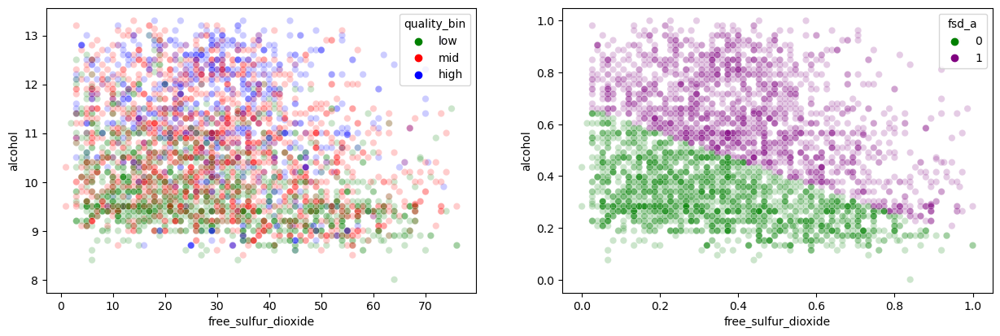

In [43]:
plt.figure(figsize=(15, 10))

plt.subplot(2,2,1)
sns.scatterplot(data=train, x='free_sulfur_dioxide', y='alcohol', hue='quality_bin', palette=c_list, alpha=0.2)

plt.subplot(2,2,2)
sns.scatterplot(data=train_scaled, x='free_sulfur_dioxide', y='alcohol', hue='fsd_a', palette= ['green', 'purple'], alpha=0.2)

plt.show()

In [44]:
pd.DataFrame(kmeans.cluster_centers_, columns=['free_sulfur_dioxide', 'alcohol'])

,free_sulfur_dioxide,alcohol
0,0.313691,0.325980
1,0.462473,0.610602


In [ ]:
# Code for histograms

plt.figure(figsize=(14,14))

for i, col in enumerate(wines.drop(columns=['wine_type', 'quality_bin'])):
    plt.subplot(4,3,i+1)
    sns.histplot(wines[col])
    
plt.show()